In [80]:
import pandas as pd

In [81]:
df=pd.read_csv("Dataset-SA.csv")
df.head()

,product_name,product_price,Rate,Review,Summary,Sentiment
0,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,super!,great cooler excellent air flow and for this p...,positive
1,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,awesome,best budget 2 fit cooler nice cooling,positive
2,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,the quality is good but the power of air is de...,positive
3,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,1,useless product,very bad product its a only a fan,negative
4,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,ok ok product,neutral


In [82]:
df['Summary'].isnull().sum()

11

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205052 entries, 0 to 205051
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   product_name   205052 non-null  object
 1   product_price  205052 non-null  object
 2   Rate           205052 non-null  object
 3   Review         180388 non-null  object
 4   Summary        205041 non-null  object
 5   Sentiment      205052 non-null  object
dtypes: object(6)
memory usage: 9.4+ MB


In [84]:
df['Sentiment'].value_counts()

Sentiment
positive    166581
negative     28232
neutral      10239
Name: count, dtype: int64

In [85]:
df=df.dropna()

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180379 entries, 0 to 205051
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   product_name   180379 non-null  object
 1   product_price  180379 non-null  object
 2   Rate           180379 non-null  object
 3   Review         180379 non-null  object
 4   Summary        180379 non-null  object
 5   Sentiment      180379 non-null  object
dtypes: object(6)
memory usage: 9.6+ MB


In [87]:
df['Sentiment'].value_counts()

Sentiment
positive    147171
negative     24401
neutral       8807
Name: count, dtype: int64

In [88]:
# df = pd.concat([
#     df[df['Sentiment'] == 'positive'].sample(n=8807, replace=True),
#     df[df['Sentiment'] == 'negative'].sample(n=8807, replace=True),
#     df[df['Sentiment'] == 'neutral']
# ])

In [89]:
df.head()

,product_name,product_price,Rate,Review,Summary,Sentiment
0,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,super!,great cooler excellent air flow and for this p...,positive
1,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,awesome,best budget 2 fit cooler nice cooling,positive
2,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,the quality is good but the power of air is de...,positive
3,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,1,useless product,very bad product its a only a fan,negative
4,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,ok ok product,neutral


In [90]:
df.reset_index(drop=True, inplace=True)

In [93]:
label=[]
for i in range(len(df['Sentiment'])):
    if df['Sentiment'][i]=='positive':
        label.append(1)
    elif df['Sentiment'][i]=='negative':
        label.append(2)
    else:
        label.append(0)
df['Label']=label 

In [94]:
df.head()

,product_name,product_price,Rate,Review,Summary,Sentiment,Label
0,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,super!,great cooler excellent air flow and for this p...,positive,1
1,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,awesome,best budget 2 fit cooler nice cooling,positive,1
2,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,the quality is good but the power of air is de...,positive,1
3,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,1,useless product,very bad product its a only a fan,negative,2
4,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,ok ok product,neutral,0


In [95]:
df['Label'].value_counts()

Label
1    147171
2     24401
0      8807
Name: count, dtype: int64

In [96]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from nltk.stem import PorterStemmer

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\user/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [97]:
facts=df['Summary'].to_list()

In [98]:
# Filter non-string values
non_string_values = [value for value in facts if not isinstance(value, str)]

print(non_string_values)

[]


In [99]:
import re 
table=str.maketrans(" "," ",string.punctuation)
stop_words=set(stopwords.words("english"))
ps=PorterStemmer()
preprocessed_text=[]
for fact in facts:
    fact=re.sub("[^A-Za-z1-9]"," ",fact)
    tokens=word_tokenize(fact)
    tokens=[token.lower() for token in tokens]
    tokens=[token.translate(table) for token in tokens]
    tokens=[token for token in tokens if token not in stop_words]
    token=[ps.stem(token) for token in tokens]
    preprocessed_text.append(" ".join(tokens))
df["Preprocessed_text"]=preprocessed_text


In [100]:
df.head()

,product_name,product_price,Rate,Review,Summary,Sentiment,Label,Preprocessed_text
0,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,super!,great cooler excellent air flow and for this p...,positive,1,great cooler excellent air flow price amazing ...
1,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,awesome,best budget 2 fit cooler nice cooling,positive,1,best budget 2 fit cooler nice cooling
2,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,the quality is good but the power of air is de...,positive,1,quality good power air decent
3,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,1,useless product,very bad product its a only a fan,negative,2,bad product fan
4,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,ok ok product,neutral,0,ok ok product


In [101]:
df['Summary'][0]

'great cooler excellent air flow and for this price its so amazing and unbelievablejust love it'

In [103]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf=TfidfVectorizer()
tf_vectors=tf.fit_transform(df['Preprocessed_text'])


In [104]:
tf_vectors[0].shape

(1, 44729)

In [27]:
# tf_vector_dense=tf_vectors.toarray()
# tf_vector_dense[0].shape

(13326,)

In [29]:
# tf_vector_dense.shape

(26421, 13326)

In [105]:
import numpy as np
average_vector = np.mean(tf_vectors, axis=0)

In [106]:
average_vector

matrix([[2.69163507e-04, 4.13153471e-06, 6.14923979e-06, ...,
         2.06172836e-06, 2.01933916e-06, 1.04969783e-06]])

In [108]:
average_vector_array = np.asarray(average_vector).reshape(1, -1)
average_vector_array

array([[2.69163507e-04, 4.13153471e-06, 6.14923979e-06, ...,
        2.06172836e-06, 2.01933916e-06, 1.04969783e-06]])

In [109]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarities=cosine_similarity(tf_vectors,average_vector_array)
cosine_similarities

array([[0.05122738],
       [0.11471901],
       [0.16923403],
       ...,
       [0.1838    ],
       [0.25904271],
       [0.06995543]])

In [110]:
cosine_similarities.shape

(180379, 1)

In [111]:
for i in range(len(df['Preprocessed_text'])):
        print(f"cosine_similarity between {df['Preprocessed_text'][i]}  and average_vector is {cosine_similarities[i]}")

cosine_similarity between great cooler excellent air flow price amazing unbelievablejust love  and average_vector is [0.05122738]
cosine_similarity between best budget 2 fit cooler nice cooling  and average_vector is [0.11471901]
cosine_similarity between quality good power air decent  and average_vector is [0.16923403]
cosine_similarity between bad product fan  and average_vector is [0.1582246]
cosine_similarity between ok ok product  and average_vector is [0.15172894]
cosine_similarity between cooler really fantastic provides good air flow highly recommended  and average_vector is [0.08868981]
cosine_similarity between good product  and average_vector is [0.78508526]
cosine_similarity between nice  and average_vector is [0.44887177]
cosine_similarity between bad cooler  and average_vector is [0.04458925]
cosine_similarity between good  and average_vector is [0.72623711]
cosine_similarity between beautiful product good material perfectly working  and average_vector is [0.22074355]
cos

In [112]:
X=tf_vectors
y=df['Label']


In [113]:
X.shape

(180379, 44729)

In [114]:
y.shape

(180379,)

In [115]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [116]:
print(X_test.shape)
print(X_train.shape)
print(y_test.shape)
print(y_train.shape)

(36076, 44729)
(144303, 44729)
(36076,)
(144303,)


In [117]:
print(X_test[0].shape)

(1, 44729)


In [118]:
from sklearn.svm import SVC
svc=SVC(kernel='linear')
svc.fit(X_train,y_train)

SVC(kernel='linear')

In [119]:
y_prediction=svc.predict(X_test)

In [120]:
y_prediction[0:5]

array([1, 1, 1, 1, 1], dtype=int64)

In [121]:
prediction=svc.predict(X_test[3])
prediction

array([1], dtype=int64)

In [122]:
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_test,y_prediction)
print(accuracy)

0.9140702960416898


In [123]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test,y_prediction)
cm

array([[  692,   760,   243],
       [  165, 28828,   511],
       [   96,  1325,  3456]], dtype=int64)

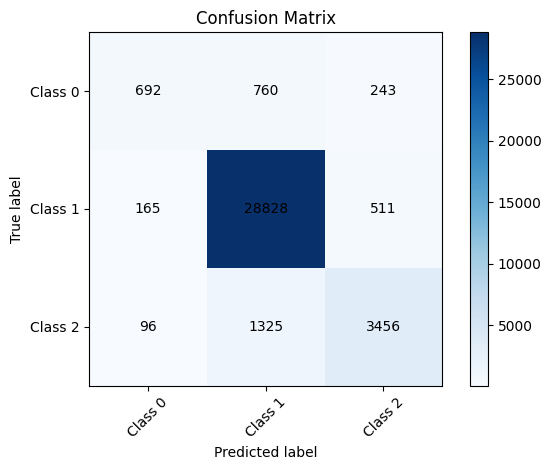

In [124]:
import matplotlib.pyplot as plt
import numpy as np


# Plot confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()

# Set tick marks
classes = ["Class 0", "Class 1", "Class 2"]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Add text annotations
for i in range(len(classes)):
    for j in range(len(classes)):
        plt.text(
            j,
            i,
            cm[i, j],
            horizontalalignment="center",
            verticalalignment="center",
        )

plt.ylabel("True label")
plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

The confusion matrix you provided is a 3x3 matrix representing the classification results of a multiclass classification problem. Each row of the matrix represents the instances in an actual class, while each column represents the instances in a predicted class. Here's how to interpret the confusion matrix:

* True Positives (TP): The diagonal elements of the matrix represent the number of instances that were correctly classified for each class. For example, in the first row, first column (index 0, 0), the value 1295 represents the number of instances from class 0 that were correctly classified as class 0.

* False Positives (FP): These are the values in the columns that do not belong to the diagonal elements of their respective rows. For example, in the first row, second column (index 0, 1), the value 193 represents the number of instances from class 1 that were incorrectly classified as class 0.

* False Negatives (FN): These are the values in the rows that do not belong to the diagonal elements of their respective columns. For example, in the second row, first column (index 1, 0), the value 205 represents the number of instances from class 0 that were incorrectly classified as class 1.

* True Negatives (TN): These are the values that do not belong to the row or column of a particular class. For example, in the third row, third column (index 2, 2), the value 1299 represents the number of instances from class 2 that were correctly classified as class 2.

In [125]:
import re 
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import string
from sklearn.feature_extraction.text import TfidfVectorizer

nltk.download('punkt')
nltk.download('stopwords')

def sentiment_prediction(review):
    review=re.sub("[^A-Za-z1-9]",' ',review)
    tokens=word_tokenize(review)
    tokens=[token.lower() for token in tokens]
    table=str.maketrans(" "," ",string.punctuation)
    tokens=[token.translate(table) for token in tokens]
    stop_words=set(stopwords.words('english'))
    tokens=[token for token in tokens if token not in stop_words]
    ps=PorterStemmer()
    tokens=[ps.stem(token) for token in tokens]
    b=" ".join(tokens)
    tf=TfidfVectorizer()
    tf_vector=tf.fit_transform([b])
    tf_vector_dense=tf_vector.toarray()
    desired_shape = (1, 44729)
    padded_array = np.zeros(desired_shape)
    original_length = tf_vector_dense.shape[1]
    padded_array[:, :original_length] = tf_vector_dense
    Prediction=svc.predict(padded_array)
    if Prediction[0]==1:
        return 'positive'
    elif Prediction[0]==0:
        return 'Neutral'
    else:
        return 'Negative'

[nltk_data] Downloading package punkt to C:\Users\user/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [126]:
review=input("Enter your  Review : ")
print(sentiment_prediction(review))

positive
